In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/

/content/drive/MyDrive


In [ ]:
!pip install youtokentome
!pip install albumentations
#!pip install transformers
#!pip install efficientnet_pytorch

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 29.9 MB/s eta 0:00:00a 0:00:01


In [ ]:
import torch
import torch.nn as nn
import torchvision
import cv2
import urllib.request
import numpy as np
import os
import time
#from tokenizers import Tokenizer
#from torchtext.data.utils import get_tokenizer
#from transformers import GPT2TokenizerFast
import random
import albumentations as albu
from albumentations.pytorch import ToTensorV2
#from efficientnet_pytorch import EfficientNet
from torchvision.models import efficientnet_v2_s, EfficientNet_V2_S_Weights
#from torchvision.transforms import Resize, RandomCrop, InterpolationMode
import youtokentome as yttm
import multiprocessing as mp
from nltk.translate.bleu_score import corpus_bleu

import matplotlib
matplotlib.rcParams.update({'figure.figsize': (16, 12), 'font.size': 14})
import matplotlib.pyplot as plt
%matplotlib inline
from IPython.display import clear_output

# Tokenizer

In [ ]:
#tokenizer = GPT2TokenizerFast.from_pretrained("distilgpt2", bos_token = "<|startoftext|>", pad_token = "<|pad|>")
#tokenizer = get_tokenizer("basic_english")

In [ ]:
def train_bpe(token_file_path, model_path, model_type="bpe", vocab_size=5000, lower=True):

    records = []
    with open(token_file_path, "r") as token_file:
        for line in token_file.readlines():
            token = line.split('\t')[1]
            records.append(token.strip(" .\n"))

    temp_file_name = "temp.txt"
    with open(temp_file_name, "w") as temp:
        for text in records:
            if lower:
                text = text.lower()
            if not text:
                continue
            temp.write(text + "\n")
    yttm.BPE.train(data=temp_file_name, vocab_size=vocab_size, model=model_path)

if not os.path.isfile('./BPE_model.bin'):
    print("Train BPE model")
    train_bpe("./Flickr8k.token.txt", "BPE_model.bin")

In [ ]:
tokenizer = yttm.BPE('/kaggle/input/bpe-model-for-image-captioning/BPE_model.bin')
#tokenizer = yttm.BPE('./BPE_model.bin')
vocabulary = tokenizer.vocab()

# Dataset

In [ ]:
random.seed(42)

class ImageCaptionDataset(torch.utils.data.Dataset):


    def __init__(self, root, img_file_path, token_file_path, tokenizer=None, 
                 transforms=None, max_length=20, lower=True, bos_token=False, attn_mask=False):

        self.root = root
        self.tokenizer = tokenizer
        self.transforms = transforms
        self.data_infos = []
        self.max_length = max_length
        self.bos_token = bos_token
        self.attn_mask = attn_mask
        img_file = open(img_file_path)
        token_file = open(token_file_path)
        content = token_file.read()

        while True:

            image_name = img_file.readline().strip()

            if not image_name:
                break

            tokens = []
            ptr = content.find(image_name)

            while True:
                
                endline = content[ptr:].find("\n")
                if endline < 0:
                    endline = len(content[ptr:]) - 1
                token = content[ptr:ptr+endline].split('\t')[1]
                if lower:
                    token = token.lower()
                tokens.append(token.strip(" .\n"))
                next = content[ptr+endline+1:].find(image_name)
                if next < 0:
                    break
                ptr += next + endline + 1

            self.data_infos.append((image_name, tokens))


    def __getitem__(self, idx):

        info = self.data_infos[idx]
        filename = self.root + '/' + info[0]
        tokens = info[1]
        img = cv2.imread(filename)

        if self.transforms:
            img = self.transforms(image=img)["image"]

        if self.tokenizer:

            text = tokens[random.randint(0, len(tokens)-1)]

            # tokenizer_output = self.tokenizer.encode_plus(
            #     #tokenizer.bos_token + text + tokenizer.eos_token, 
            #     text + tokenizer.eos_token, 
            #     max_length=self.max_length,
            #     padding="max_length",
            #     return_tensors="pt"
            # )

            # return {
            #     "image": img,
            #     "tokens": torch.squeeze(tokenizer_output["input_ids"], 0), 
            #     "mask": tokenizer_output["attention_mask"]
            # }

            tokens = self.tokenizer.encode(text, bos=self.bos_token, eos=True)
            pad_starts = None
            if len(tokens) > self.max_length:
                tokens[self.max_length-1] = self.tokenizer.subword_to_id('<EOS>')
                tokens = tokens[:self.max_length]
            elif self.attn_mask:
                pad_starts = len(tokens)
            tensor_outputs = torch.zeros((self.max_length), dtype=torch.long)
            tensor_outputs[:len(tokens)] = torch.LongTensor(tokens)
            tokens = tensor_outputs

            mask = torch.zeros(self.max_length, dtype=torch.bool)
            if self.attn_mask:
                if pad_starts:
                    mask[pad_starts:] = True
                    
                return {
                    "image": img,
                    "tokens": tokens,
                    "attention_mask": mask
                }

        return {
            "image": img,
            "tokens": tokens
        }


    def __len__(self):
        return len(self.data_infos)

In [ ]:
#backbone = EfficientNet.from_pretrained('efficientnet-b4')
#backbone = efficientnet_v2_s(weights=EfficientNet_V2_S_Weights.IMAGENET1K_V1)

In [ ]:
print(EfficientNet_V2_S_Weights.IMAGENET1K_V1.transforms())

ImageClassification(

    crop_size=[384]

    resize_size=[384]

    mean=[0.485, 0.456, 0.406]

    std=[0.229, 0.224, 0.225]

    interpolation=InterpolationMode.BILINEAR

)


In [ ]:
IMAGE_SIZE = 384 #380 for b4

train_transforms = albu.Compose(
    [
        albu.SmallestMaxSize(IMAGE_SIZE),
        albu.RandomCrop(IMAGE_SIZE, IMAGE_SIZE),
        albu.HorizontalFlip(p=0.5),
        albu.ColorJitter(brightness=0.2, contrast=0.2, p=0.5),
        albu.GaussNoise(),
        albu.Normalize(),
        ToTensorV2(),
    ]
)
val_transforms = albu.Compose(
    [
        albu.SmallestMaxSize(IMAGE_SIZE),
        albu.RandomCrop(IMAGE_SIZE, IMAGE_SIZE),
        albu.Normalize(),
        ToTensorV2(),
    ]
)

In [ ]:
bos_token=False

In [ ]:
train_dataset = ImageCaptionDataset("./Flicker8k_Dataset", "./Flickr_8k.trainImages.txt", "./Flickr8k.token.txt", tokenizer, train_transforms, bos_token=bos_token)
val_dataset = ImageCaptionDataset("./Flicker8k_Dataset", "./Flickr_8k.devImages.txt", "./Flickr8k.token.txt", tokenizer, val_transforms, bos_token=bos_token)
test_dataset = ImageCaptionDataset("./Flicker8k_Dataset", "./Flickr_8k.testImages.txt", "./Flickr8k.token.txt")

['the dogs are in the snow in front of a fence', 'the dogs play on the snow', 'two brown dogs playfully fight in the snow', 'two brown dogs wrestle in the snow', 'two dogs playing in the snow']


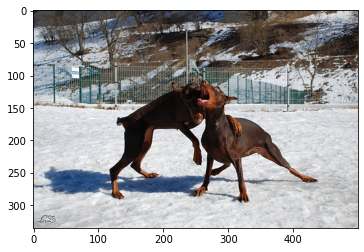

In [ ]:
data = test_dataset[0]
print(data['tokens'])
plt.imshow(data['image'][:,:,::-1])
plt.show()

In [ ]:
data = val_dataset[17]
print(tokenizer.decode(data['tokens'].squeeze().tolist()))
print(data['tokens'].size())

['a black and white dog carrying an orange ball coming out of the water<EOS><PAD><PAD><PAD><PAD><PAD>']

torch.Size([20])


In [ ]:
batch_size = 32
num_workers = 2

In [ ]:
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers, pin_memory=True)
val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, pin_memory=True)

In [ ]:
def caption_random_test_image(caption_func):
    data = test_dataset[random.randint(0, len(test_dataset)-1)]
    temps = [0, 0.5, 1]
    for t in temps:
        pred = caption_func(model, data["image"], tokenizer, val_transforms, t)
        print(f"Predicted caption with {t} temperature: {pred}")
    plt.imshow(data['image'][:,:,::-1])
    plt.show()
    print("\n")

# Train script

In [ ]:
def train_epoch(model, iterator, optimizer, criterion, clip, tokenizer=None, train_history=None, valid_history=None, scheduler=None, attn_mask=False):

    model.train()
    
    epoch_loss = 0
    history = []
    device = model.device

    for i, batch in enumerate(iterator):
        
        images = batch["image"].to(device)
        tokens = batch["tokens"].to(device)
        if attn_mask:
            mask = batch["attention_mask"].to(device)
        
        optimizer.zero_grad()

        if attn_mask:
            outputs = model(images, tokens[:,:-1], mask[:,:-1]) # [batch, seq, vocab_size]
            loss = criterion(outputs.reshape(-1, outputs.shape[2]), tokens[:,1:].reshape(-1))
        else:
            outputs = model(images, tokens[:,:-1]) # [batch, seq, vocab_size]
            loss = criterion(outputs.reshape(-1, outputs.shape[2]), tokens.reshape(-1))

        loss.backward()
        
        if clip:
            torch.nn.utils.clip_grad_norm_(model.parameters(), clip)
        
        optimizer.step()

        # if scheduler:
        #     scheduler.step(loss)
        
        epoch_loss += loss.item()
        
        history.append(loss.cpu().data.numpy())
        if (i+1)%10==0:
            fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12, 8))

            clear_output(True)
            ax[0].plot(history, label='train loss')
            ax[0].set_xlabel('Batch')
            ax[0].set_title('Train loss')
            if train_history is not None:
                ax[1].plot(train_history, label='general train history')
                ax[1].set_xlabel('Epoch')
            if valid_history is not None:
                ax[1].plot(valid_history, label='general valid history')
            plt.legend()
            
            plt.show()

            if tokenizer:
                example = outputs[0]
                predicted = example.argmax(1)
                print("Real: " + tokenizer.decode(tokens.tolist())[0])
                print("Predicted: " + tokenizer.decode(predicted.tolist())[0])

        del images, tokens, outputs
        torch.cuda.empty_cache()

    
    if scheduler:
        scheduler.step(epoch_loss)
        
    return epoch_loss / len(iterator)

def evaluate_epoch(model, iterator, criterion, attn_mask=False):
    
    model.eval()
    
    epoch_loss = 0
    
    history = []
    
    with torch.no_grad():
    
        for i, batch in enumerate(iterator):

            images = batch["image"].to(device)
            tokens = batch["tokens"].to(device)
            if attn_mask:
                mask = batch["attention_mask"].to(device)

            if attn_mask:
                outputs = model(images, tokens[:,:-1], mask[:,:-1]) # [batch, seq, vocab_size]
                loss = criterion(outputs.reshape(-1, outputs.shape[2]), tokens[:,1:].reshape(-1))
            else:
                outputs = model(images, tokens[:,:-1]) # [batch, seq, vocab_size]
                loss = criterion(outputs.reshape(-1, outputs.shape[2]), tokens.reshape(-1))
            
            epoch_loss += loss.item()

            del images, tokens, outputs
            torch.cuda.empty_cache()
        
    return epoch_loss / len(iterator)

def epoch_time(start_time, end_time):
    elapsed_time = end_time - start_time
    elapsed_mins = int(elapsed_time / 60)
    elapsed_secs = int(elapsed_time - (elapsed_mins * 60))
    return elapsed_mins, elapsed_secs

In [ ]:
def train(model, train_dataloader, val_dataloader, optimizer, criterion, n_epochs=10, save_path="best-val-model.pt", scheduler=None, clip=None, tokenizer=None, attn_mask=False):

    train_history = []
    valid_history = []

    best_valid_loss = float('inf')

    for epoch in range(n_epochs):
        
        start_time = time.time()
        
        train_loss = train_epoch(model, train_dataloader, optimizer, criterion, clip, tokenizer, train_history, valid_history, scheduler, attn_mask)
        valid_loss = evaluate_epoch(model, val_dataloader, criterion, attn_mask)
        
        end_time = time.time()
        
        epoch_mins, epoch_secs = epoch_time(start_time, end_time)

        torch.save(model.state_dict(), "last-" + save_path)
        torch.save(optimizer.state_dict(), "last-optim-" + save_path)
        
        if valid_loss < best_valid_loss:
            best_valid_loss = valid_loss
            torch.save(model.state_dict(), "best-" + save_path)
            torch.save(optimizer.state_dict(), "best-optim-" + save_path)
        
        train_history.append(train_loss)
        valid_history.append(valid_loss)
        print(f'Epoch: {epoch+1:02} | Time: {epoch_mins}m {epoch_secs}s')
        print(f'\tTrain Loss: {train_loss:.3f}')
        print(f'\t Val. Loss: {valid_loss:.3f}')

# LSTM

In [ ]:
class EncoderCNN(nn.Module):

    def __init__(self, embed_size, train_CNN=False, dropout=0):
        super(EncoderCNN, self).__init__()
        self.encoder = efficientnet_v2_s(weights=EfficientNet_V2_S_Weights.IMAGENET1K_V1)
        #self.encoder = EfficientNet.from_pretrained('efficientnet-b4')
        for name, param in self.encoder.named_parameters():
            param.requires_grad = train_CNN
        #self.encoder.classifier[1] = nn.Linear(in_features=1280, out_features=embed_size)
        dummy_input = torch.randn((1, 3, IMAGE_SIZE, IMAGE_SIZE))
        in_features = self.encoder(dummy_input).shape[1]
        self.encoder_linear = nn.Linear(in_features, embed_size)
        # self.relu = nn.ReLU()
        # self.dropout = nn.Dropout(dropout)

    def forward(self, images):
        features = self.encoder(images)
        features = features.view(features.shape[0], -1)
        features = self.encoder_linear(features)
        #return self.dropout(self.relu(features))
        return features


class DecoderRNN(nn.Module):

    def __init__(self, embed_size, hidden_size, vocab_size, num_layers, dropout=0.5):
        super(DecoderRNN, self).__init__()
        self.embed = nn.Embedding(vocab_size, embed_size)
        self.lstm = nn.LSTM(embed_size, hidden_size, num_layers, batch_first=True)
        self.linear = nn.Linear(hidden_size, vocab_size)
        self.dropout = nn.Dropout(dropout)

    def forward(self, features, captions):
        embeddings = self.dropout(self.embed(captions))
        embeddings = torch.cat((features.unsqueeze(1), embeddings), dim=1)
        hiddens, _ = self.lstm(embeddings) # [batch, seq, emb_size]
        outputs = self.linear(hiddens)
        return outputs


class ImageCaptioningModelRNN(nn.Module):

    def __init__(self, embed_size, hidden_size, vocab_size, num_layers, device, train_CNN=False):
        super(ImageCaptioningModelRNN, self).__init__()
        self.encoderCNN = EncoderCNN(embed_size, train_CNN)
        self.decoderRNN = DecoderRNN(embed_size, hidden_size, vocab_size, num_layers)
        self.device = device
        if device == torch.device('cuda'):
            self.cuda()
        else:
            self.cpu()

    def forward(self, images, captions):
        features = self.encoderCNN(images)
        outputs = self.decoderRNN(features, captions)
        return outputs

In [ ]:
embed_size = 512
hidden_size = 1024
vocab_size = len(vocabulary)
num_layers = 1
train_CNN = False
n_epochs = 20

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
print(device)

cuda


In [ ]:
model = ImageCaptioningModelRNN(embed_size, hidden_size, vocab_size, num_layers, device, train_CNN)

Downloading: "https://download.pytorch.org/models/efficientnet_v2_s-dd5fe13b.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_v2_s-dd5fe13b.pth


  0%|          | 0.00/82.7M [00:00<?, ?B/s]

In [ ]:
optimizer = torch.optim.Adam(
    [p for p in model.parameters() if p.requires_grad], betas=(0.9, 0.999), lr=5e-5
)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=1, factor=0.1, min_lr=1e-7)
#scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, 0.5)
#scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=3e-4, steps_per_epoch=len(train_dataloader), epochs=n_epochs)
#scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda= lambda epoch: 0.9 ** epoch)
criterion = nn.CrossEntropyLoss(ignore_index=tokenizer.subword_to_id('<PAD>'))

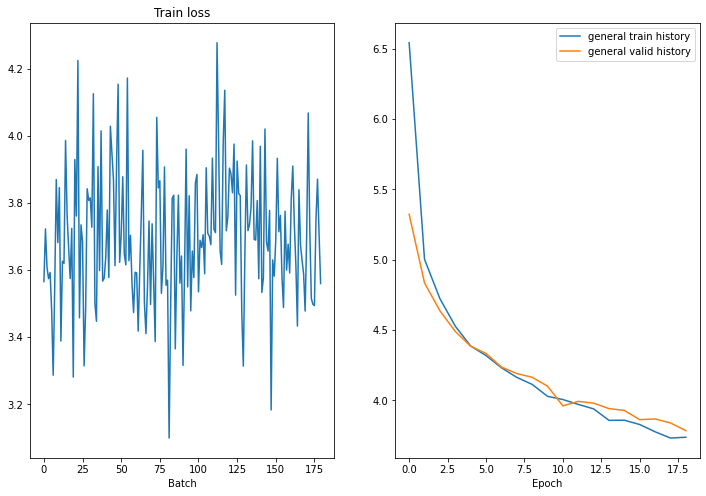

Real: a brown dog is leaping into a garden swimming pool<EOS><PAD><PAD><PAD><PAD><PAD><PAD><PAD><PAD><PAD>

Predicted: a dog dog is running a the grassy<EOS><EOS><EOS><EOS><EOS><EOS><EOS><EOS><EOS><EOS><EOS><EOS>

Epoch: 20 | Time: 2m 29s

	Train Loss: 3.697

	 Val. Loss: 3.773


In [ ]:
train(model, train_dataloader, val_dataloader, optimizer, criterion, n_epochs=n_epochs, save_path="RNN-model-1024-1l.pt", scheduler=scheduler, tokenizer=tokenizer)

In [ ]:
def softmax(x, temperature):
    e_x = torch.exp(x / temperature)
    return e_x / torch.sum(e_x, dim=0)

def caption_image(model, image, tokenizer, transforms, temp, max_length=20):
    model.eval()
    result_caption = []

    if transforms:
        image = transforms(image=image)["image"]

    with torch.no_grad():
        image = image.to(model.device).unsqueeze(0)
        x = model.encoderCNN(image)
        states = None

        for _ in range(max_length):
            hiddens, states = model.decoderRNN.lstm(x, states)
            output = model.decoderRNN.linear(hiddens.squeeze(0))
            if temp <= 0:
                predicted = output.argmax(0)
            else:
                output = softmax(output, temp)
                predicted = torch.multinomial(output, 1).squeeze(0)
            if predicted.item() == tokenizer.subword_to_id('<EOS>'): #tokenizer.eos_token_id
                break
            result_caption.append(predicted.item())
            x = model.decoderRNN.embed(predicted).unsqueeze(0)

    return tokenizer.decode(result_caption)[0] #" ".join([tokenizer.decode(idx) for idx in result_caption])

In [ ]:
def print_bleu(model, dataset, tokenizer, transforms, caption_func, temp=0, max_iter=0, max_length=20):
    original_text = []
    generated_text = []

    for i, data in enumerate(dataset):
        pred = caption_func(model, data["image"], tokenizer, transforms, temp, max_length)
        original_refs = []
        for j in range(len(data["tokens"])):
            original_refs.append(data["tokens"][j].split())
        original_text.append(original_refs)
        generated_text.append(pred.split())
        if i+1 == max_iter:
            break

    print(corpus_bleu(original_text, generated_text) * 100)

In [ ]:
model.load_state_dict(torch.load('last-RNN-model-1024-1l.pt', map_location=device))
optimizer.load_state_dict(torch.load('last-optim-RNN-model-1024-1l.pt', map_location=device))

In [ ]:
print_bleu(model, test_dataset, tokenizer, val_transforms, caption_image, 0)

9.692519664369424


In [ ]:
print_bleu(model, test_dataset, tokenizer, val_transforms, caption_image, 0.5)

7.240736982781348


Predicted caption with 0 temperature: a man in a red shirt is standing on a bench

Predicted caption with 0.5 temperature: a man in a red uniform and green a black shirt and a white dog is jumping in the air

Predicted caption with 1 temperature: a group of boys walking players their boys in the sky


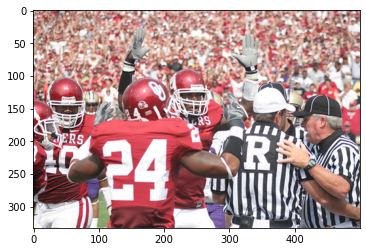





Predicted caption with 0 temperature: a man is riding a trick on a bike

Predicted caption with 0.5 temperature: a man wearing a yellow shirt is sitting on a surfboard

Predicted caption with 1 temperature: a child between a rail 's looks underwear up


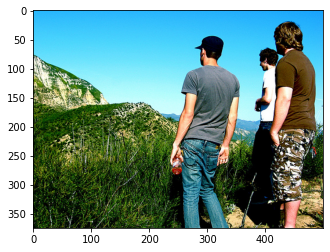





Predicted caption with 0 temperature: a man is riding a trick on a bike

Predicted caption with 0.5 temperature: a man and a woman is riding a rock on a bench

Predicted caption with 1 temperature: the skier fl with two goalr basketball on a rail


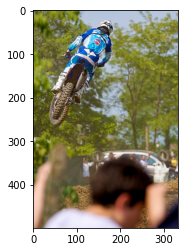





Predicted caption with 0 temperature: a young boy wearing a red shirt and a blue shirt is standing on a bench

Predicted caption with 0.5 temperature: a young boy wearing a pink shirt and blue shorts is walking on the street

Predicted caption with 1 temperature: a boy head a gray pin on a slide and one young


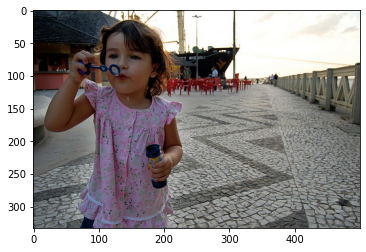





Predicted caption with 0 temperature: a man in a red shirt is running through the air

Predicted caption with 0.5 temperature: a boy in a white shirt and a red shirt is playing in the air

Predicted caption with 1 temperature: a young boy playing guitar on the sand


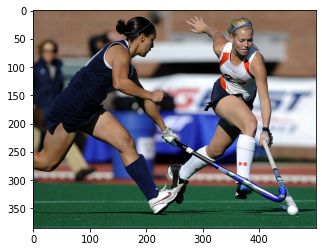

In [ ]:
for i in range(5):
    caption_random_test_image(caption_image)

# Transformer

In [ ]:
class DecoderTransformer(nn.Module):

    def __init__(self, embed_size, dim_feedforward, vocab_size, num_heads, num_layers, device, dropout=0.1, max_length=20):
        super(DecoderTransformer, self).__init__()
        self.token_embed = nn.Embedding(vocab_size, embed_size)
        self.positional_embed = nn.Embedding(max_length, embed_size)
        decoder_layer = nn.TransformerDecoderLayer(embed_size, num_heads, dim_feedforward, dropout, batch_first=True)
        self.decoder = nn.TransformerDecoder(decoder_layer, num_layers)
        self.linear = nn.Linear(embed_size, vocab_size)
        self.max_length = max_length
        self.embed_size = embed_size
        self.device = device

    def forward(self, features, caption, target_pad_mask):
        batch_size, sequence_length = caption.shape[0], caption.shape[1]

        scale = torch.sqrt(torch.tensor([self.embed_size])).to(self.device)
        x = self.token_embed(caption) * scale
        position = (
            torch.arange(0, sequence_length)
            .unsqueeze(0)
            .repeat(batch_size, 1)
            .to(self.device)
        )
        x += self.positional_embed(position) # [batch, seq, emb_size]

        features = features.unsqueeze(1) # [batch, 1, emb_size]
        target_subsequent_mask = (
            nn.Transformer()
            .generate_square_subsequent_mask(x.shape[1])
            .to(self.device)
        )
        x = self.decoder(
            x,
            features,
            tgt_mask=target_subsequent_mask,
            tgt_key_padding_mask=target_pad_mask,
        )
        out = self.linear(x)
        return out

class ImageCaptioningModelTransformer(nn.Module):

    def __init__(self, embed_size, dim_feedforward, vocab_size, num_heads, num_layers, device, train_CNN=False, dropout=0.1, max_length=20):
        super(ImageCaptioningModelTransformer, self).__init__()
        self.encoderCNN = EncoderCNN(embed_size, train_CNN)
        self.decoderTransformer = DecoderTransformer(embed_size, dim_feedforward, vocab_size, num_heads, num_layers, device, dropout, max_length)
        self.device = device
        if device == torch.device('cuda'):
            self.cuda()
        else:
            self.cpu()

    def forward(self, images, captions, attn_mask):
        features = self.encoderCNN(images)
        outputs = self.decoderTransformer(features, captions, attn_mask)
        return outputs

In [ ]:
def softmax(x, temperature):
    e_x = torch.exp(x / temperature)
    return e_x / torch.sum(e_x, dim=0)

def caption_image_transformer(model, image, tokenizer, transforms=None, temp=0, max_length=20):
    model.eval()
    result_caption = []

    if transforms:
        image = transforms(image=image)["image"]
    image = image.to(model.device).unsqueeze(0)

    target_indexes = [tokenizer.subword_to_id('<BOS>')] + [tokenizer.subword_to_id('<PAD>')] * (max_length - 1)
    for i in range(max_length - 1):
        caption = torch.LongTensor(target_indexes).unsqueeze(0)
        mask = torch.zeros((1, max_length), dtype=torch.bool)
        mask[:, i+1:] = True

        with torch.no_grad():
            output = model(image, caption.to(model.device), mask.to(model.device)).squeeze(0) # [seq_len, vocab_size]

        output = output[i]

        if temp <= 0:
            predicted = output.argmax(0)
        else:
            output = softmax(output, temp)
            predicted = torch.multinomial(output, 1).squeeze(0)
        predicted = predicted.item()
        if predicted == tokenizer.subword_to_id('<EOS>'):
            break
        result_caption.append(predicted)
        target_indexes[i + 1] = predicted

    return tokenizer.decode(result_caption)[0]

In [ ]:
train_dataset = ImageCaptionDataset("./Flicker8k_Dataset", "./Flickr_8k.trainImages.txt", "./Flickr8k.token.txt", tokenizer, train_transforms, bos_token=True, attn_mask=True)
val_dataset = ImageCaptionDataset("./Flicker8k_Dataset", "./Flickr_8k.devImages.txt", "./Flickr8k.token.txt", tokenizer, val_transforms, bos_token=True, attn_mask=True)
test_dataset = ImageCaptionDataset("./Flicker8k_Dataset", "./Flickr_8k.testImages.txt", "./Flickr8k.token.txt")

In [ ]:
mp.cpu_count()

2

In [ ]:
batch_size = 32
num_workers = mp.cpu_count() # 2

In [ ]:
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers, pin_memory=True)
val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, pin_memory=True)

In [ ]:
embed_size = 512
dim_feedforward = 1024
vocab_size = len(vocabulary)
num_heads = 8
num_layers = 1
train_CNN = False
dropout = 0.1
n_epochs = 20
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
model = ImageCaptioningModelTransformer(embed_size, dim_feedforward, vocab_size, num_heads, num_layers, device, train_CNN, dropout)

In [ ]:
optimizer = torch.optim.Adam(
    [p for p in model.parameters() if p.requires_grad], betas=(0.9, 0.999), lr=5e-5
)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=3, factor=0.1, min_lr=1e-7)
criterion = nn.CrossEntropyLoss(ignore_index=tokenizer.subword_to_id('<PAD>'))

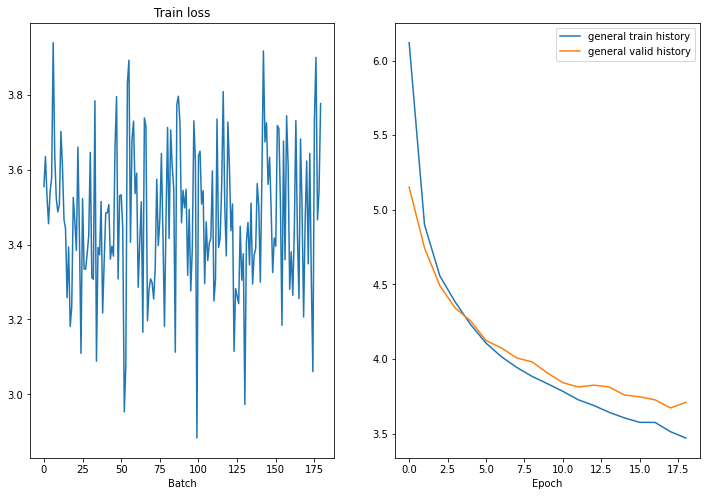

Real: <BOS> a young boy and girl hug and smile<EOS><PAD><PAD><PAD><PAD><PAD><PAD><PAD><PAD><PAD><PAD>

Predicted: a young girl is a in<EOS> a<EOS><EOS><EOS><EOS><EOS><EOS><EOS><EOS><EOS><EOS><EOS>

Epoch: 20 | Time: 4m 3s

	Train Loss: 3.472

	 Val. Loss: 3.592


In [ ]:
train(model, train_dataloader, val_dataloader, optimizer, criterion, n_epochs=n_epochs, save_path="transformer-model-1024-1l-8h.pt", scheduler=scheduler, tokenizer=tokenizer, attn_mask=True)

In [ ]:
print_bleu(model, test_dataset, tokenizer, val_transforms, caption_image_transformer, 0, 100)

9.408072279561884


In [ ]:
print_bleu(model, test_dataset, tokenizer, val_transforms, caption_image_transformer, 0.5, 100)

11.103049412648987

In [ ]:
model.load_state_dict(torch.load('last-transformer-model-1024-1l-8h.pt', map_location=device))
optimizer.load_state_dict(torch.load('last-optim-transformer-model-1024-1l-8h.pt', map_location=device))

In [ ]:
optimizer.param_groups[0]['lr'] = 5e-6
n_epochs = 30

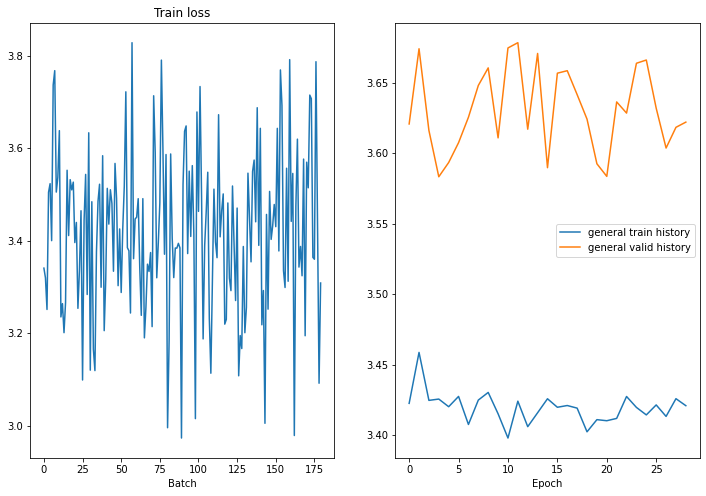

Real: <BOS> there are two dogs , black and white , and the black one is jumping<EOS><PAD><PAD><PAD>

Predicted: a are two dogs are a dogs one dogs one one grass dogs is walking in in in in

Epoch: 30 | Time: 4m 45s

	Train Loss: 3.418

	 Val. Loss: 3.591


In [ ]:
train(model, train_dataloader, val_dataloader, optimizer, criterion, n_epochs=n_epochs, save_path="transformer-model-1024-1l-8h-v2.pt", scheduler=scheduler, tokenizer=tokenizer, attn_mask=True)

In [ ]:
print_bleu(model, test_dataset, tokenizer, val_transforms, caption_image_transformer, 0, 100) # LAST MODEL V2

11.241778454616593


In [ ]:
print_bleu(model, test_dataset, tokenizer, val_transforms, caption_image_transformer, 0.5, 100)

9.878180653504714


In [ ]:
model.load_state_dict(torch.load('last-transformer-model-1024-1l-8h-v2.pt', map_location=device))
optimizer.load_state_dict(torch.load('last-optim-transformer-model-1024-1l-8h-v2.pt', map_location=device))

Predicted caption with 0 temperature: a woman in a black and a white shirt is standing on a

Predicted caption with 0.5 temperature: a boy in a blue and blue shirt is wearing a red and a blue shirt and a picture

Predicted caption with 1 temperature: two girls hold for the middle of pull


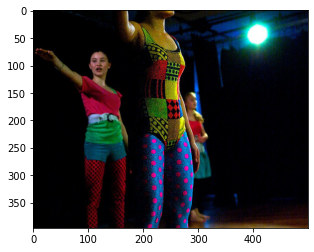





Predicted caption with 0 temperature: a man in a red jacket is standing on a snowy mountain

Predicted caption with 0.5 temperature: a man in a red coat and two people in a snowy hill

Predicted caption with 1 temperature: three young people surrounded by orange sled plasbody peak


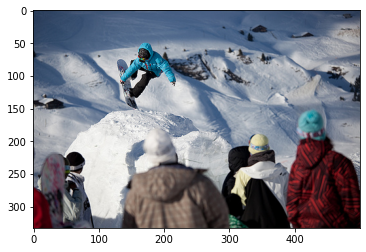





Predicted caption with 0 temperature: a brown dog is running through the grass

Predicted caption with 0.5 temperature: a brown dog is running through a grassy field

Predicted caption with 1 temperature: dirt sitting in phone by a green grass


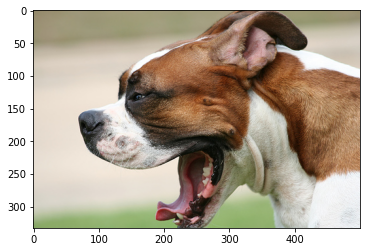





Predicted caption with 0 temperature: a boy in a red shirt is wearing a red shirt and blue shirt and blue shirt and blue

Predicted caption with 0.5 temperature: a girl with a red hair is holding a baby in the background

Predicted caption with 1 temperature: a little toddler together


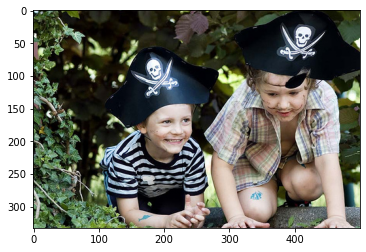





Predicted caption with 0 temperature: a young boy wearing a red shirt and a red shirt is standing on a red shirt and a

Predicted caption with 0.5 temperature: a girl in a red hat is leaping into the camera

Predicted caption with 1 temperature: a little blonde hair and a interacting away in the murky rock wall


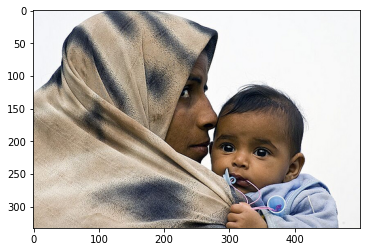

In [ ]:
for i in range(5):
    caption_random_test_image(caption_image_transformer)

# Bigger Transformer

In [ ]:
train_dataset = ImageCaptionDataset("/kaggle/input/flicker8k/Flickr8k_Dataset/Flicker8k_Dataset", 
                                    "/kaggle/input/flicker8k/Flickr8k_text/Flickr_8k.trainImages.txt", 
                                    "/kaggle/input/flicker8k/Flickr8k_text/Flickr8k.token.txt", 
                                    tokenizer, train_transforms, bos_token=True, attn_mask=True)
val_dataset = ImageCaptionDataset("/kaggle/input/flicker8k/Flickr8k_Dataset/Flicker8k_Dataset", 
                                    "/kaggle/input/flicker8k/Flickr8k_text/Flickr_8k.devImages.txt", 
                                    "/kaggle/input/flicker8k/Flickr8k_text/Flickr8k.token.txt", 
                                    tokenizer, train_transforms, bos_token=True, attn_mask=True)
test_dataset = ImageCaptionDataset("/kaggle/input/flicker8k/Flickr8k_Dataset/Flicker8k_Dataset", 
                                    "/kaggle/input/flicker8k/Flickr8k_text/Flickr_8k.testImages.txt", 
                                    "/kaggle/input/flicker8k/Flickr8k_text/Flickr8k.token.txt")

In [ ]:
batch_size = 64
num_workers = mp.cpu_count() # 2

In [ ]:
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers, pin_memory=True)
val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, pin_memory=True)

In [ ]:
embed_size = 800
dim_feedforward = 2048
vocab_size = len(vocabulary)
num_heads = 8
num_layers = 1
train_CNN = False
dropout = 0.1
n_epochs = 50
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
model = ImageCaptioningModelTransformer(embed_size, dim_feedforward, vocab_size, num_heads, num_layers, device, train_CNN, dropout)

Downloading: "https://download.pytorch.org/models/efficientnet_v2_s-dd5fe13b.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_v2_s-dd5fe13b.pth


  0%|          | 0.00/82.7M [00:00<?, ?B/s]

In [ ]:
optimizer = torch.optim.Adam(
    [p for p in model.parameters() if p.requires_grad], betas=(0.9, 0.98), lr=5e-5
)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=3, factor=0.1, min_lr=1e-7)
criterion = nn.CrossEntropyLoss(ignore_index=tokenizer.subword_to_id('<PAD>'))

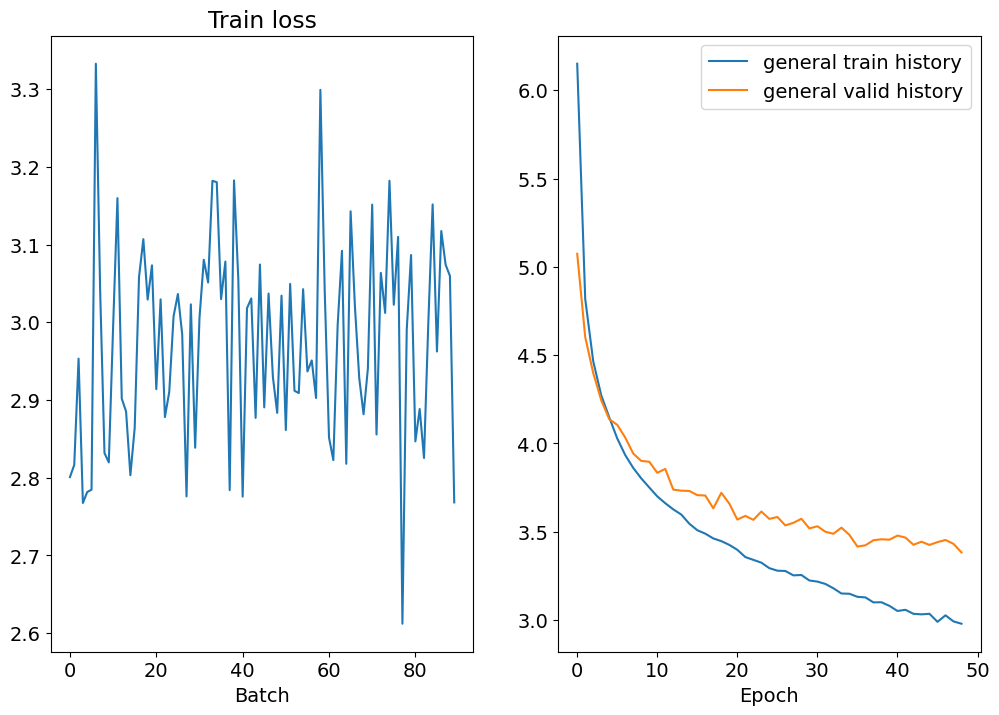

Real: <BOS> player number 23 dunks the basketball into the net with a crowd in the background<EOS><PAD>
Predicted: a in 23 the in the basketball player the basketball<EOS> the basketball<EOS> the air<EOS><EOS>
Epoch: 50 | Time: 2m 53s
	Train Loss: 2.969
	 Val. Loss: 3.410


In [ ]:
train(model, train_dataloader, val_dataloader, optimizer, criterion, n_epochs=n_epochs, save_path="transformer-model-2048-1l-8h.pt", scheduler=scheduler, tokenizer=tokenizer, attn_mask=True)

In [ ]:
print(optimizer.param_groups[0]['lr'])

5e-05


In [ ]:
print_bleu(model, test_dataset, tokenizer, val_transforms, caption_image_transformer, 0, 100) # LAST MODEL 2048

13.201881737711323


In [ ]:
print_bleu(model, test_dataset, tokenizer, val_transforms, caption_image_transformer, 0.5, 100)

12.81578090643897


Predicted caption with 0 temperature: a man is standing on a rock

Predicted caption with 0.5 temperature: a dog is walking down a stream

Predicted caption with 1 temperature: a group of people with distant stand on the sand


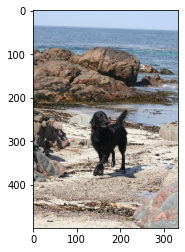





Predicted caption with 0 temperature: a group of people are playing a game

Predicted caption with 0.5 temperature: a group of people are standing in front of them

Predicted caption with 1 temperature: a girl , with a white hat and an older girl in a stadium is standing in the background


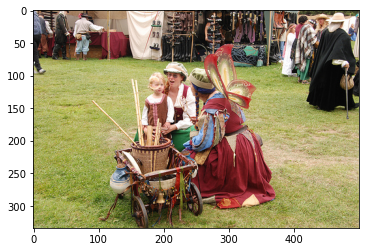





Predicted caption with 0 temperature: a man in a black jacket is standing in front of a large crowd

Predicted caption with 0.5 temperature: a man wearing a blue coat and red hat and blue hat is holding a pink pants , wearing

Predicted caption with 1 temperature: a man wearing a hoodie outfit rides up a cafeade


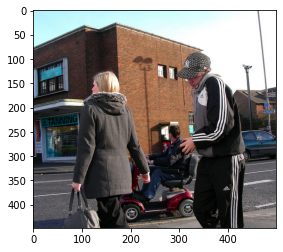





Predicted caption with 0 temperature: a football player in red uniform is holding a red and white uniform and black shirt

Predicted caption with 0.5 temperature: a football player in red jersey is running on the ball

Predicted caption with 1 temperature: boys viewers defe byelleders


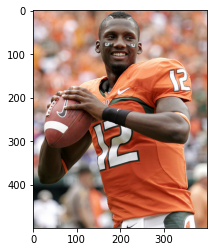





Predicted caption with 0 temperature: a skier is skiing down a snowy hill

Predicted caption with 0.5 temperature: a person in a blue jacket is skiing down a snow

Predicted caption with 1 temperature: a child stand in ski snowy mountains


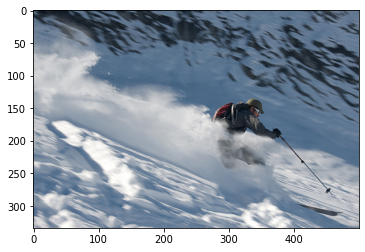

In [ ]:
for i in range(5):
    caption_random_test_image(caption_image_transformer)

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.load_state_dict(torch.load('/kaggle/input/transformermodelcheckpoint2048/last-transformer-model-2048-1l-8h.pt', map_location=device))
optimizer.load_state_dict(torch.load('/kaggle/input/transformermodelcheckpoint2048/last-optim-transformer-model-2048-1l-8h.pt', map_location=device))

In [ ]:
n_epochs = 50
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=3, factor=0.1, min_lr=1e-7)
criterion = nn.CrossEntropyLoss(ignore_index=tokenizer.subword_to_id('<PAD>'))

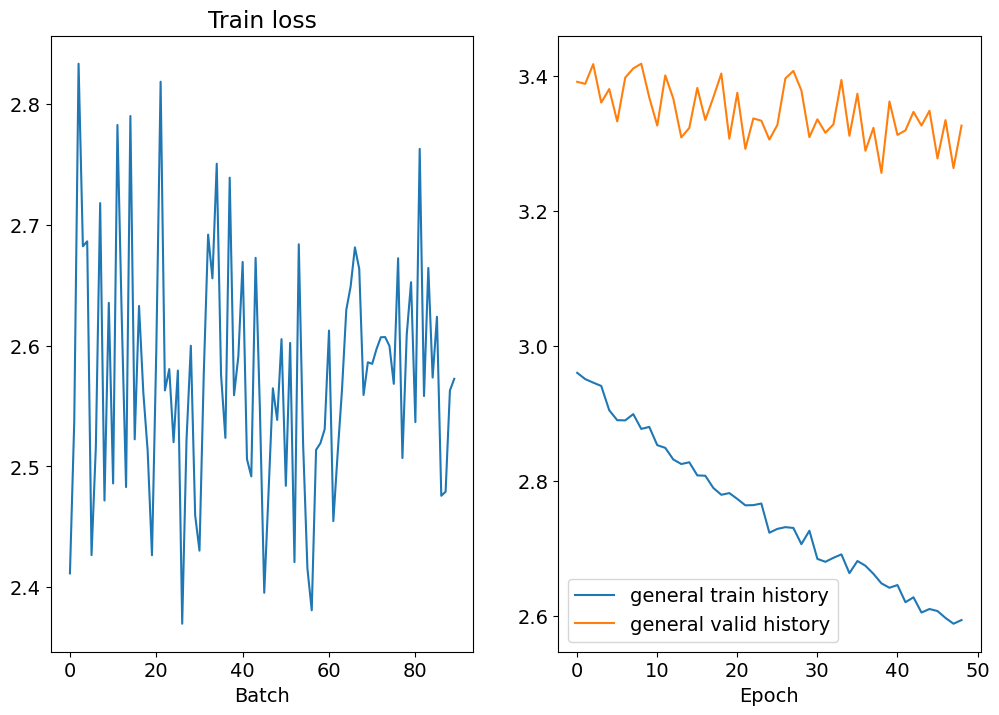

Real: <BOS> a dog runs across the snow<EOS><PAD><PAD><PAD><PAD><PAD><PAD><PAD><PAD><PAD><PAD><PAD><PAD>
Predicted: a dog is on the water<EOS><EOS> to to<EOS> through<EOS><EOS> to to<EOS> to to
Epoch: 50 | Time: 2m 56s
	Train Loss: 2.575
	 Val. Loss: 3.298


In [ ]:
train(model, train_dataloader, val_dataloader, optimizer, criterion, n_epochs=n_epochs, save_path="transformer-model-2048-1l-8h-v2.pt", scheduler=scheduler, tokenizer=tokenizer, attn_mask=True)

In [ ]:
print(optimizer.param_groups[0]['lr'])

5e-05


In [ ]:
print_bleu(model, test_dataset, tokenizer, val_transforms, caption_image_transformer, 0, 100) # LAST MODEL 2048 V2

15.020151021990792


In [ ]:
print_bleu(model, test_dataset, tokenizer, val_transforms, caption_image_transformer, 0.5, 100)

13.00412792444137


In [ ]:
print_bleu(model, test_dataset, tokenizer, val_transforms, caption_image_transformer, 1, 100)

6.728757475639361


Predicted caption with 0 temperature: a snowboarder is on a snowy mountain

Predicted caption with 0.5 temperature: a person in the snow

Predicted caption with 1 temperature: the man on a white snow


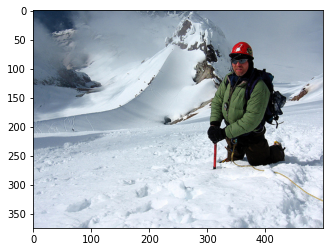





Predicted caption with 0 temperature: a black and brown dog is running through the grass

Predicted caption with 0.5 temperature: a black dog is running in the grass

Predicted caption with 1 temperature: two dogs play with each shooting snowball and play on a motorized a purple and floppy ears harness


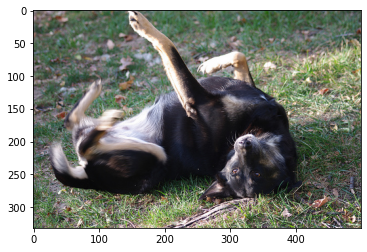





Predicted caption with 0 temperature: a man in a red shirt is standing in a crowd of people are standing in a crowd

Predicted caption with 0.5 temperature: a man is standing on a busy street

Predicted caption with 1 temperature: men are paddling off a balcony


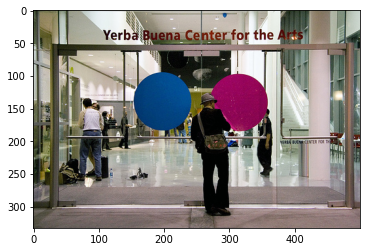





Predicted caption with 0 temperature: a man in a black shirt and white shirt and white shirt and white shirt is standing on a

Predicted caption with 0.5 temperature: a man dressed in black is walking on a white shirt and black pants

Predicted caption with 1 temperature: a man in white shirt and an orange dress with a concrete slope


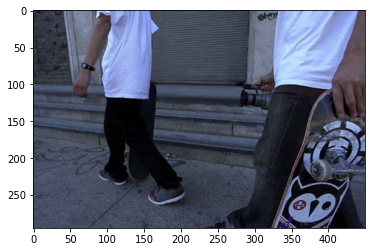





Predicted caption with 0 temperature: a man is sitting on a wall

Predicted caption with 0.5 temperature: a man and a woman are sitting on a blue and a wall

Predicted caption with 1 temperature: a man in a gray jacket is jumping onto a watery bridge


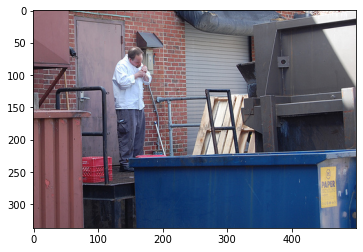

In [ ]:
for i in range(5):
    caption_random_test_image(caption_image_transformer)

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.load_state_dict(torch.load('/kaggle/input/transformermodelcheckpoint2048/last-transformer-model-2048-1l-8h-v2.pt', map_location=device))
optimizer.load_state_dict(torch.load('/kaggle/input/transformermodelcheckpoint2048/last-optim-transformer-model-2048-1l-8h-v2.pt', map_location=device))

In [ ]:
n_epochs = 50
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=3, factor=0.1, min_lr=1e-7)
criterion = nn.CrossEntropyLoss(ignore_index=tokenizer.subword_to_id('<PAD>'))

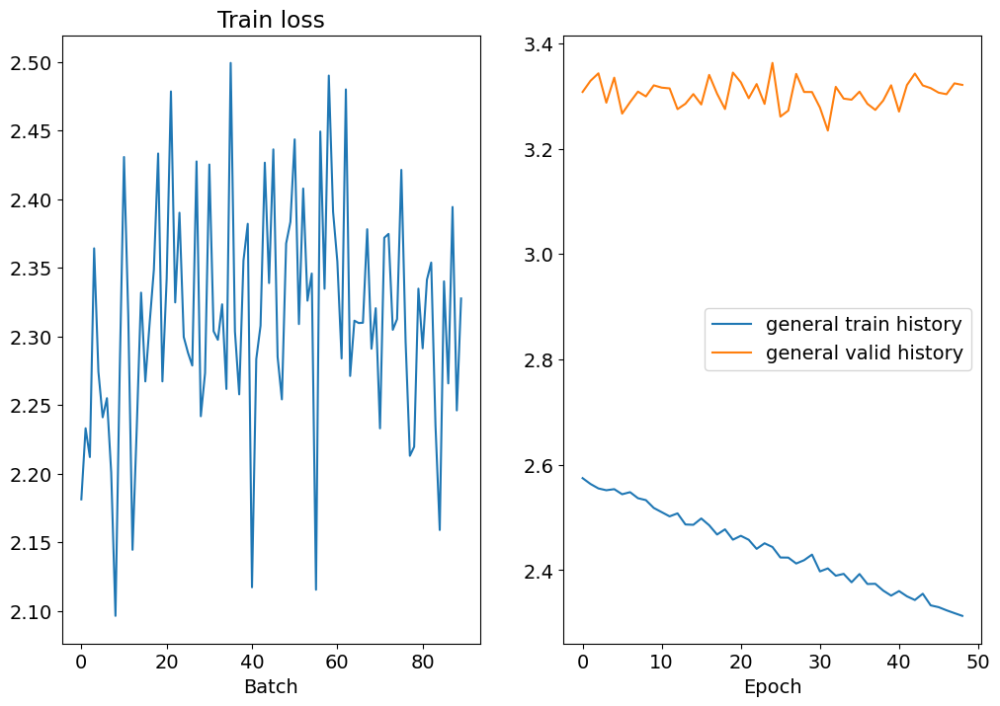

Real: <BOS> a man in sunglasses smiles<EOS><PAD><PAD><PAD><PAD><PAD><PAD><PAD><PAD><PAD><PAD><PAD><PAD><PAD>
Predicted: a man with a and<EOS><EOS> on down on down and down down down down on shirt down
Epoch: 50 | Time: 3m 6s
	Train Loss: 2.313
	 Val. Loss: 3.266


In [ ]:
train(model, train_dataloader, val_dataloader, optimizer, criterion, n_epochs=n_epochs, save_path="transformer-model-2048-1l-8h-v3.pt", scheduler=scheduler, tokenizer=tokenizer, attn_mask=True)

In [ ]:
print_bleu(model, test_dataset, tokenizer, val_transforms, caption_image_transformer, 0, 100) # LAST MODEL 2048 V3

15.052652860599716


In [ ]:
print_bleu(model, test_dataset, tokenizer, val_transforms, caption_image_transformer, 0.5, 100)

12.781624632202563


Predicted caption with 0 temperature: a white dog is running through the snow
Predicted caption with 0.5 temperature: a white dog running on the beach
Predicted caption with 1 temperature: four children hang out in the city


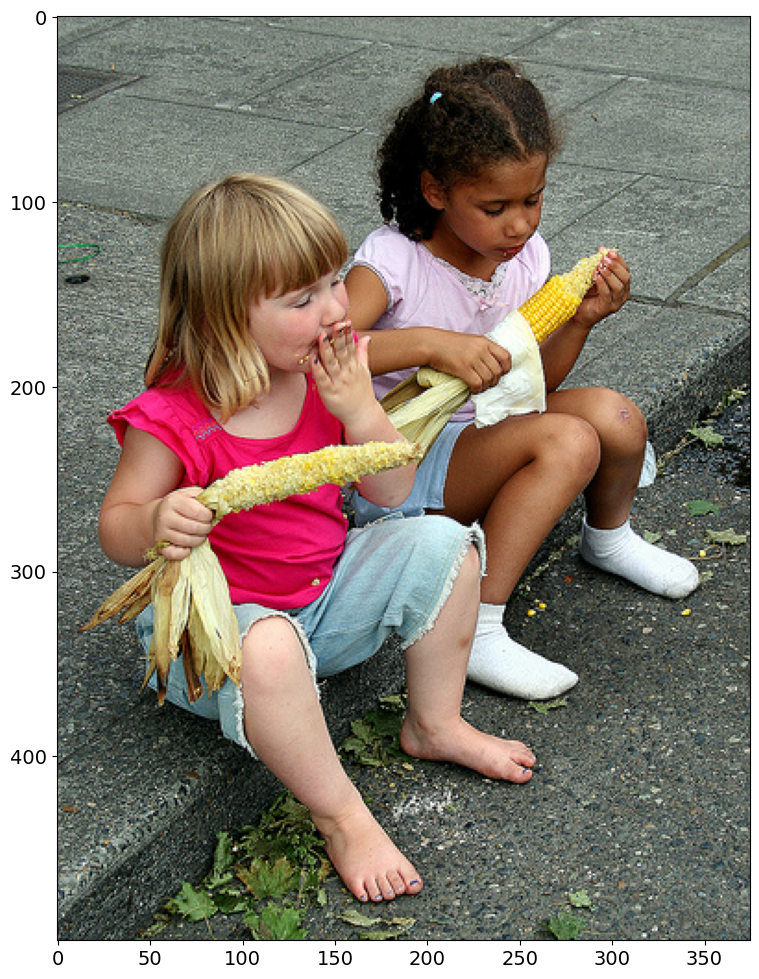



Predicted caption with 0 temperature: a brown dog is chewing on a leash
Predicted caption with 0.5 temperature: a dog is chewing on a leash with a leash with a stick
Predicted caption with 1 temperature: a brown and a black and white dog is chewing onit skating


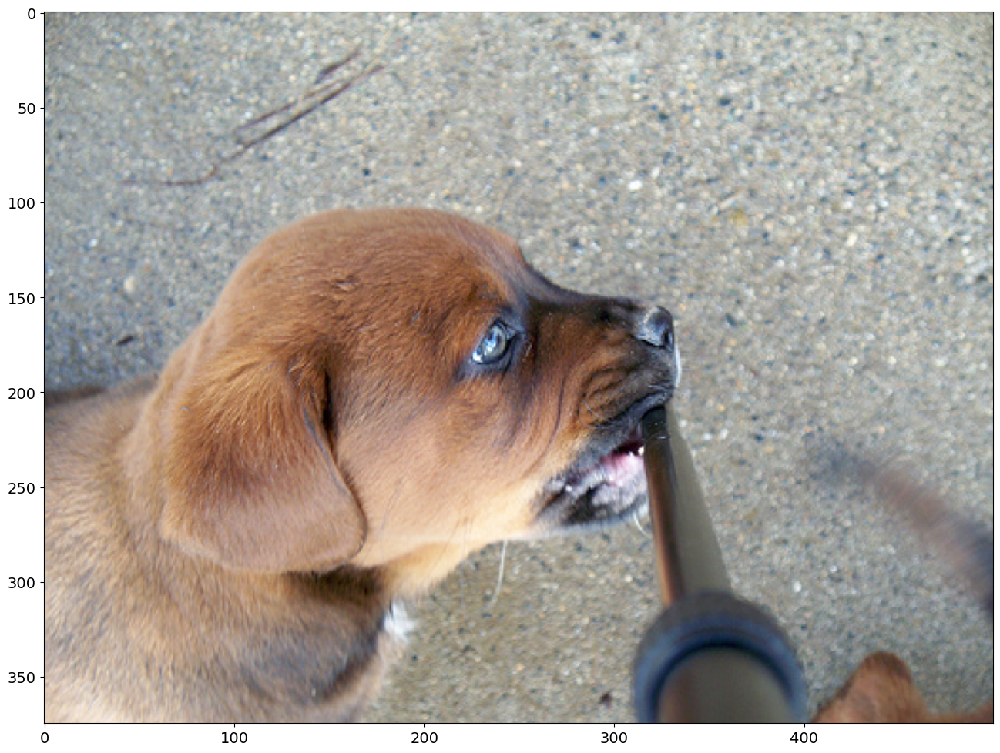



Predicted caption with 0 temperature: a dog is jumping in the air to catch a ball
Predicted caption with 0.5 temperature: a dog is in the air to catch a ball
Predicted caption with 1 temperature: the brown and white dog is playing with his toy on play in the background and spigator


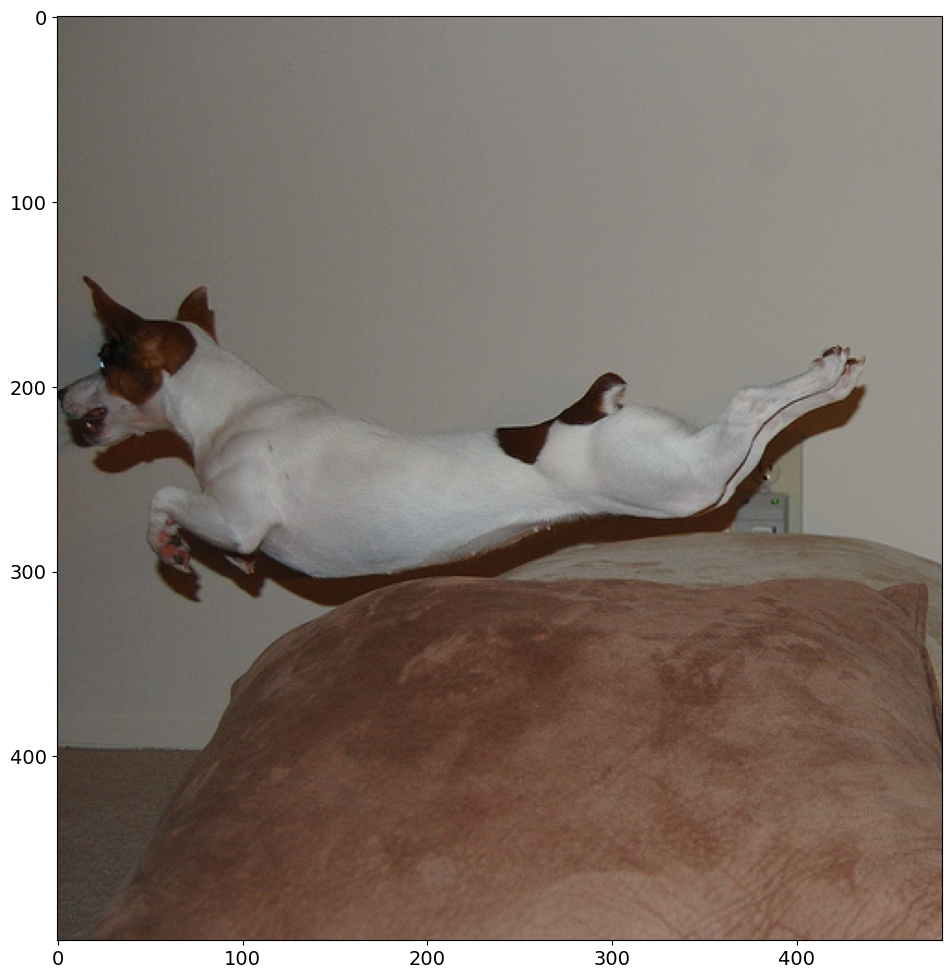



Predicted caption with 0 temperature: a dog sled through the snow
Predicted caption with 0.5 temperature: two dogs are running in the snow
Predicted caption with 1 temperature: a shirtless man chases a man carries a girl in the snowy winter clothes is pulling something


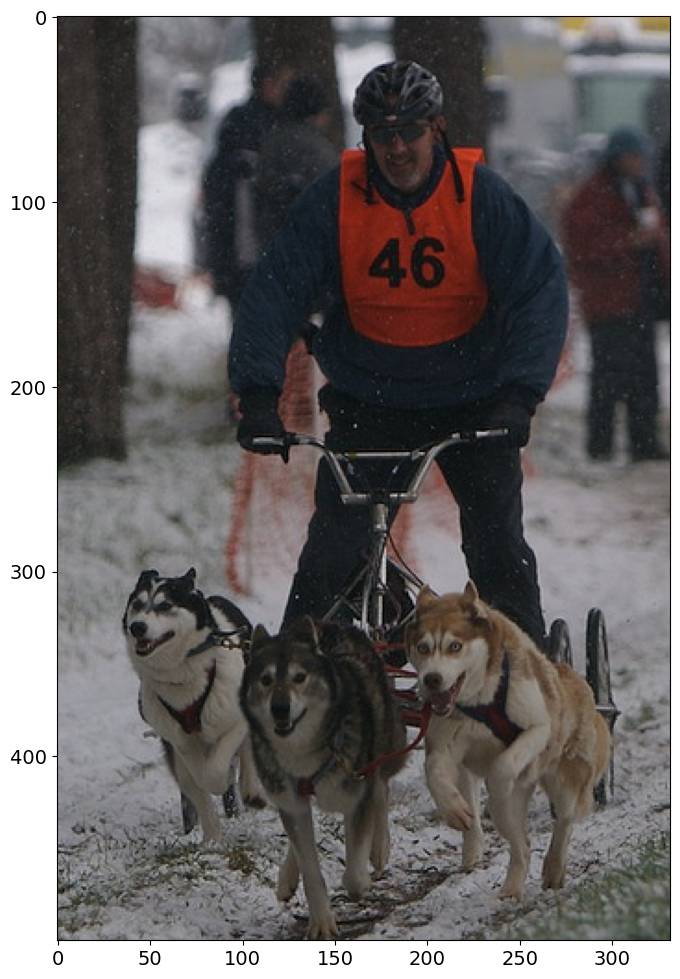



Predicted caption with 0 temperature: a young boy wearing a red swim trunks is standing in the water
Predicted caption with 0.5 temperature: three girls are playing in the water
Predicted caption with 1 temperature: a girl in red and white bathing suit carries a boy in bathing suit swimming suitsway performed


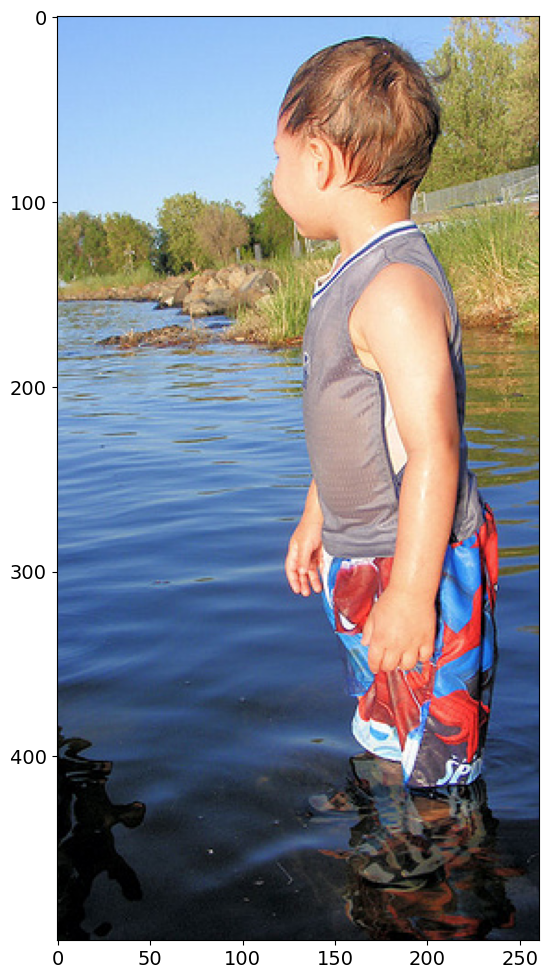

In [ ]:
for i in range(5):
    caption_random_test_image(caption_image_transformer)

Качество модели уже сильно не меняется, лосс на обучающей выборке уменьшается, а вот на валидации - нет. Также метрика BLEU-4 почти не увеличилась. Лучшая модель получилась на основе декодера-трансформера с 1 слоем и 8 головами внимания с метрикой BLEU-4 примерно равной 15. На тестовых картинках видно, что некоторые примеры модель описывает довольно неплохо, иногда даже хорошо, но некоторые неудачно. Вероятно, лучшего результата можно добиться, если увеличивать модель, в частности добавить слои в декодере. Но такой подход потребует больших ресурсов на обучение. Также лучших результатов можно добиться с более сложной архитектурой, например, с использованием промежуточного детектирования объектов и добавлением этих объектов в итоговое описание картинки.

# Beam Search Decode

In [ ]:
def beam_search(model, image, tokenizer, transforms, n_beams=3, top=3, max_length=20):
    model.eval()
    result_captions = torch.zeros((0, max_length + 1), dtype=torch.float)

    if transforms:
        image = transforms(image=image)["image"]
    image = image.to(model.device).unsqueeze(0)

    target_indexes = torch.FloatTensor([tokenizer.subword_to_id('<BOS>')] + [tokenizer.subword_to_id('<PAD>')] * (max_length - 1) + [1])

    caption = target_indexes[:-1].long().unsqueeze(0)
    mask = torch.zeros((1, max_length), dtype=torch.bool)
    mask[:, 1:] = True

    with torch.no_grad():
        output = model(image, caption.to(model.device), mask.to(model.device)).squeeze(0)
    output = output[0]
    output = nn.functional.softmax(output, dim=0)
    prob, indices = output.topk(n_beams, dim=0) # [n_beams]

    target_indexes = target_indexes.repeat(n_beams, 1)
    target_indexes[:, 1] = indices 
    target_indexes[:, -1] = prob # [n_beams, max_length] <BOS> topk <PAD> ... <PAD> prob

    worst_of_best = 0

    for t in target_indexes:
        if t[1] == tokenizer.subword_to_id('<EOS>'):
            result_captions = torch.cat((result_captions, t.unsqueeze(0)), 0)
            t[-1] = 0
            
    target_indexes = target_indexes[target_indexes[:, -1] != 0]

    for i in range(1, max_length - 1):
        caption = target_indexes[:, :-1].long()
        exp_image = image.expand(len(caption), -1, -1, -1)
        mask = torch.zeros((len(caption), max_length), dtype=torch.bool)
        mask[:, i+1:] = True

        with torch.no_grad():
            output = model(exp_image, caption.to(model.device), mask.to(model.device)) # [len_caption, seq_len, vocab_size]

        output = output[:,i,:] # [len_caption, vocab_size]

        output = nn.functional.softmax(output, dim=1)
        prob, indices = output.topk(n_beams, dim=1) # [len_caption, n_beams] for top prevs select top next words

        target_indexes = target_indexes.repeat_interleave(n_beams, dim=0)
        target_indexes[:, i + 1] = indices.view(-1) # [n_beams * len_caption, max_length]
        target_indexes[:, -1] *= prob.view(-1)
        target_indexes = target_indexes[target_indexes[:, -1] > worst_of_best] # filter probabilities less than worst of top

        if len(target_indexes) >= n_beams:
            _, idx = target_indexes[:,-1].topk(n_beams, dim=0)
            target_indexes = torch.index_select(target_indexes, 0, idx)

        for t in target_indexes:
            if t[i + 1] == tokenizer.subword_to_id('<EOS>') or i == max_length - 2:
                result_captions = torch.cat((result_captions, t.unsqueeze(0)), 0)
                t[-1] = 0
        target_indexes = target_indexes[target_indexes[:, -1] != 0]

        if len(result_captions) >= top:
            _, idx = result_captions[:,-1].topk(top, dim=0)
            result_captions = torch.index_select(result_captions, 0, idx)
            worst_of_best = result_captions[-1, -1]

        if len(target_indexes) == 0:
            break

    if len(result_captions) > top:
        _, idx = result_captions[:,-1].topk(top, dim=0)
        result_captions = torch.index_select(result_captions, 0, idx)
    
    result_captions = result_captions[:, :-1].long().tolist()
    special_tokens = set([tokenizer.subword_to_id('<BOS>'), tokenizer.subword_to_id('<EOS>'), tokenizer.subword_to_id('<PAD>')])
    result_captions_filtered = []
    for caption in result_captions:
        result_captions_filtered.append(list(filter(lambda x: x not in special_tokens, caption)))
    return tokenizer.decode(result_captions_filtered)

In [ ]:
def caption_random_test_image_beam_search():
    data = test_dataset[random.randint(0, len(test_dataset)-1)]
    preds = beam_search(model, data["image"], tokenizer, val_transforms)
    for i, p in enumerate(preds):
        print(f"Predicted caption # {i+1} : {p}")
    plt.imshow(data['image'][:,:,::-1])
    plt.show()
    print("\n")

Predicted caption # 1 : a group of people are standing on a tent

Predicted caption # 2 : a group of people are standing in front of a tent

Predicted caption # 3 : a group of people are standing in front of a line


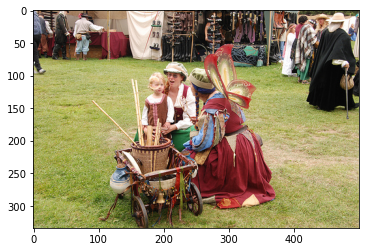





Predicted caption # 1 : a brown dog is running through a grassy field

Predicted caption # 2 : a brown dog is running through the grass

Predicted caption # 3 : a brown dog running through a grassy field


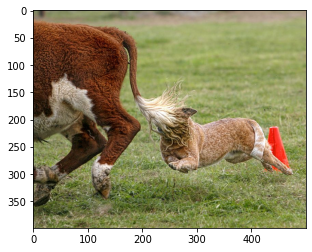





Predicted caption # 1 : a surfer rides a wave

Predicted caption # 2 : a surfer is riding a wave

Predicted caption # 3 : a surfer is riding a wave in the ocean


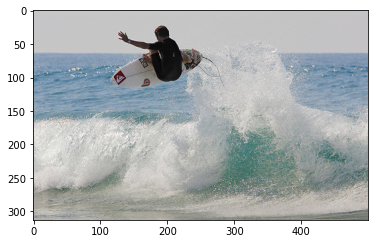





Predicted caption # 1 : a person in a red jacket is riding a red jacket is riding a red jacket is riding a

Predicted caption # 2 : a person in a red jacket is riding a red jacket is riding a red jacket and blue and

Predicted caption # 3 : a person in a red jacket is riding a red jacket is riding a red jacket and black


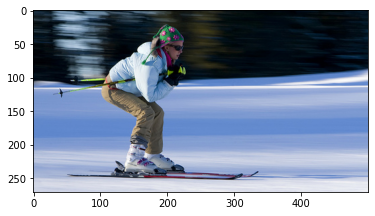





Predicted caption # 1 : a little girl in a yellow dress is jumping in the air

Predicted caption # 2 : a little girl in a yellow dress is jumping on the air

Predicted caption # 3 : a little girl in a yellow dress is jumping in the air above the air


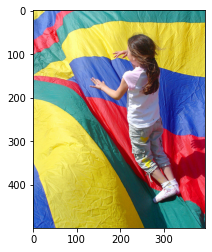

In [ ]:
for i in range(5):
    caption_random_test_image_beam_search()

# Captions from other images

In [ ]:
model.load_state_dict(torch.load('last-transformer-model-2048-1l-8h-v2.pt', map_location=device))

In [ ]:
def caption_from_url(url):
    req = urllib.request.urlopen(url)
    arr = np.asarray(bytearray(req.read()), dtype=np.uint8)
    img = cv2.imdecode(arr, -1)
    pred = beam_search(model, img, tokenizer, val_transforms, top=1)
    print("Predicted caption:", pred[0])
    plt.imshow(img[:,:,::-1])
    plt.show()

Predicted caption: a woman in a white shirt sits in a doorway


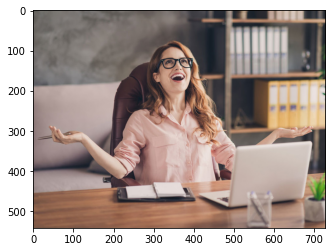

In [ ]:
caption_from_url('https://n1s1.hsmedia.ru/33/5c/5b/335c5be5512691d13d10f21bce0dd8ed/728x542_1_76f76c4de66830f38cf5e01b57ce6cdf@1000x745_0xac120003_14360269801591194181.jpg')

Predicted caption: a young boy is running down a sidewalk


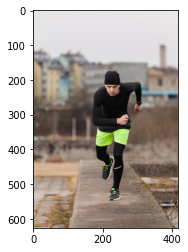

In [ ]:
caption_from_url('https://img.freepik.com/free-photo/man-sprinting_23-2147617999.jpg')

Predicted caption: a brown and black dog is running through the grass


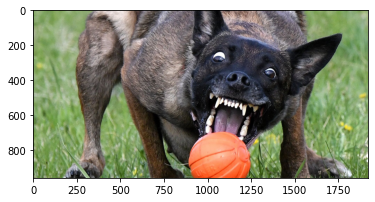

In [ ]:
caption_from_url('https://cdnn1.inosmi.ru/img/24985/10/249851004_0:196:2030:1211_1920x0_80_0_0_78318b59d4ce0cde91f76a1b092765e7.jpg')

Predicted caption: a child in a blue shirt is sitting on a blue slide


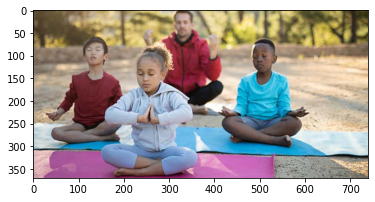

In [ ]:
caption_from_url('https://www.anahana.com/hubfs/meditating-kids-coach-and-kids-meditating-in-park-740.jpg')